In [1]:
import torch
if torch.cuda.is_available():
    print("GPU name:", torch.cuda.get_device_name(0)) 

GPU name: NVIDIA GeForce RTX 4060 Ti


In [1]:
from pathlib import Path
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt



DATA_ROOT = Path(r"G:/My Drive/CLPD-MF-Dataset/smart phone")  
assert DATA_ROOT.exists(), f"Dataset folder not found at {DATA_ROOT}"
print("Found dataset root:", DATA_ROOT)

imgs_path = [
    "G:/My Drive/CLPD-MF-Dataset/smart phone/MF/12 6-25/x20/IMAGE 2026-03-24 18 26 08.jpg",
    "G:/My Drive/CLPD-MF-Dataset/smart phone/MF/12 6-25/x20/IMAGE 2026-03-24 18 26 13.jpg",
    "G:/My Drive/CLPD-MF-Dataset/smart phone/MF/81 1-26/x10/IMG_3754 2.jpeg",
    "G:/My Drive/CLPD-MF-Dataset/smart phone/MF/81 1-26/x20/IMG_3757 2.jpeg",
    "G:/My Drive/CLPD-MF-Dataset/smart phone/Non-MF/pseudolymphoma/74 9-25/x20/IMG_3977.jpeg",
    "G:/My Drive/CLPD-MF-Dataset/smart phone/Non-MF/pseudolymphoma/74 9-25/x10/IMG_3975.jpeg",
    "G:/My Drive/CLPD-MF-Dataset/smart phone/Non-MF/T-cell dyscrasia/8 10-25/x10/IMG_3905.jpeg"
]

Found dataset root: G:\My Drive\CLPD-MF-Dataset\smart phone


In [2]:
def smart_crop_microscope(image_path):
    """
    Performs a 'smart crop' on a microscope image to remove large black borders
    and isolate the circular illuminated field of view.
    """
    # 1. Read the image
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not load image at {image_path}")
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 2. Method 1: Contour Detection
    # Convert to grayscale and apply slight Gaussian blur
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Apply binary threshold
    _, thresh = cv2.threshold(blurred, 15, 255, cv2.THRESH_BINARY)
    
    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if not contours:
        print("No contours found.")
        return img_rgb
        
    # Find the largest contour
    largest_contour = max(contours, key=cv2.contourArea)
    
    # Calculate bounding rectangle
    x, y, w, h = cv2.boundingRect(largest_contour)
    
    # Crop the original image to this bounding box
    cropped = img_rgb[y:y+h, x:x+w].copy()
    
    # 3. Method 2: Circular Masking (Cleanup)
    # Create a circular mask matching the cropped bounding box
    mask = np.zeros((h, w), dtype=np.uint8)
    center = (w // 2, h // 2)
    # The radius should fit within the bounding box
    radius = min(w // 2, h // 2)
    cv2.circle(mask, center, radius, 255, -1)
    
    # Apply the mask to the cropped image, converting remaining black corners to white
    # Create a white background image
    white_bg = np.ones_like(cropped) * 255
    
    # Where mask is 255, use the cropped image, else use white background
    final_img = np.where(mask[..., None] == 255, cropped, white_bg)
    
    # 4. Output & Verification: Plot side-by-side comparison
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    axes[0].imshow(img_rgb)
    axes[0].set_title("Original Image")
    axes[0].axis('off')
    
    axes[1].imshow(thresh, cmap='gray')
    axes[1].set_title("Binary Threshold Mask")
    axes[1].axis('off')
    
    axes[2].imshow(final_img)
    axes[2].set_title("Final Cropped & Masked Image")
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return final_img

Testing smart_crop_microscope on all sample images:

Cropping IMAGE 2026-03-24 18 26 08.jpg ---


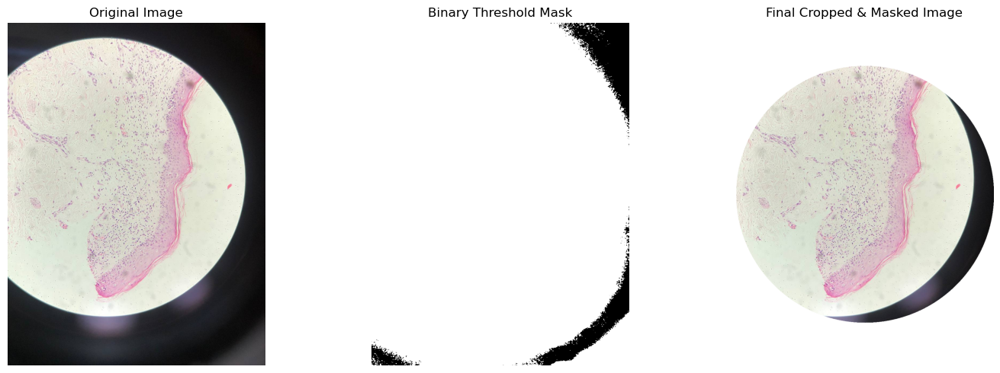


Cropping IMAGE 2026-03-24 18 26 13.jpg ---


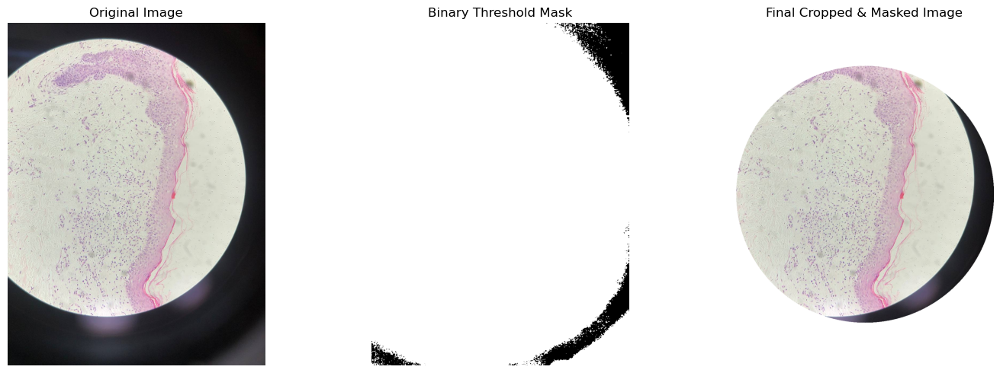


Cropping IMG_3754 2.jpeg ---


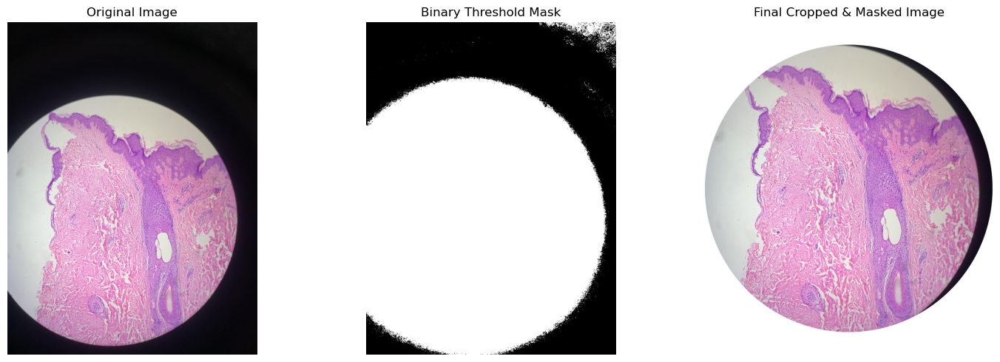


Cropping IMG_3757 2.jpeg ---


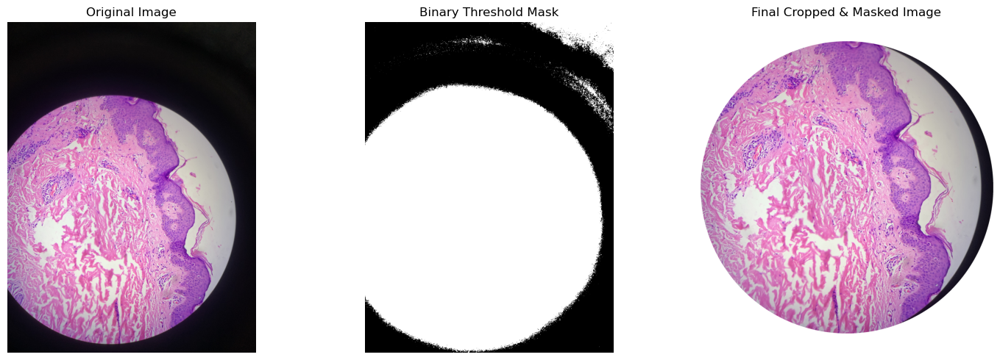


Cropping IMG_3977.jpeg ---


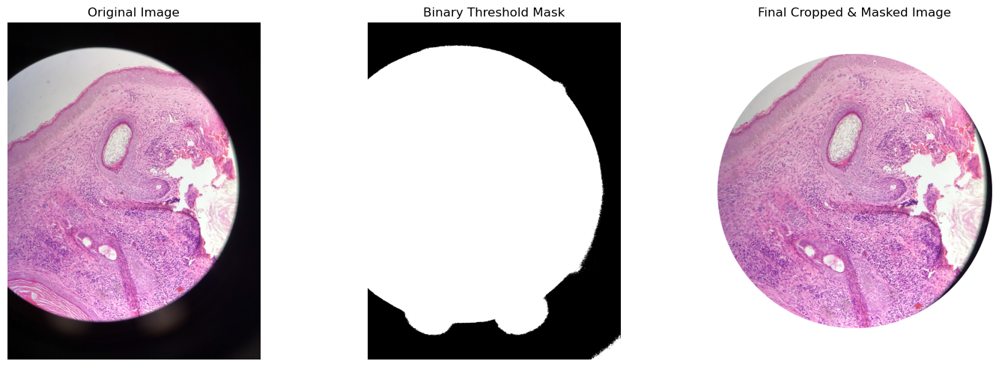


Cropping IMG_3975.jpeg ---


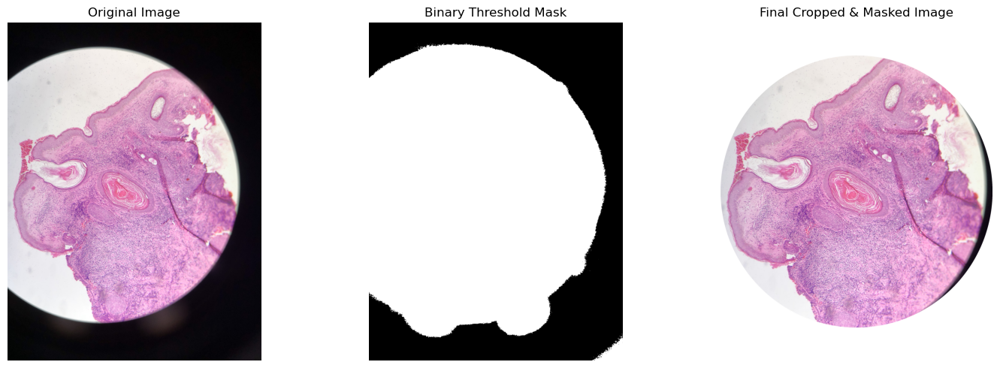


Cropping IMG_3905.jpeg ---


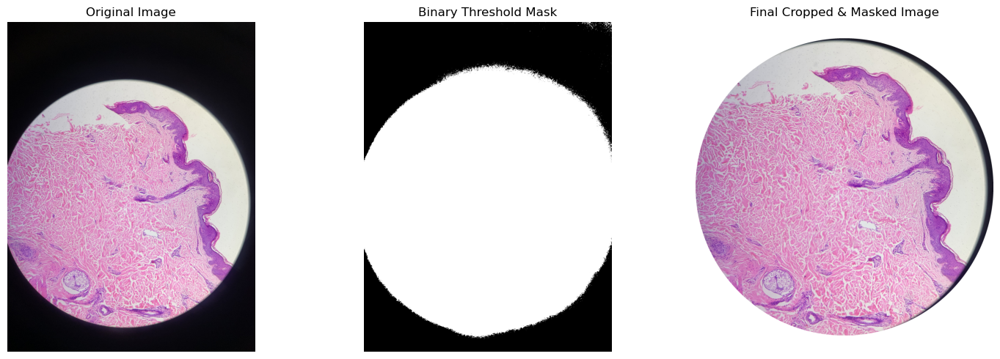

In [3]:
# Call the smart_crop_microscope function on all images in imgs_path and store results
cropped_images = {}
print("Testing smart_crop_microscope on all sample images:")
for img_p in imgs_path:
    print(f"\nCropping {Path(img_p).name} ---")
    try:
        cropped_img = smart_crop_microscope(img_p)
        cropped_images[img_p] = cropped_img
    except Exception as e:
        print(f"Error processing {img_p}: {e}")



Processing: IMAGE 2026-03-24 18 26 08.jpg
Image Size: 960x1280, Patch Size: 512, Stride: 512


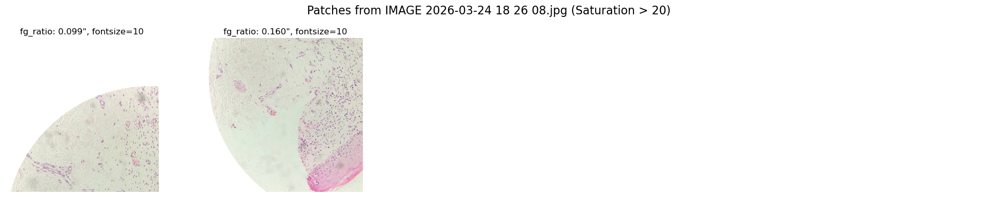


Processing: IMAGE 2026-03-24 18 26 13.jpg
Image Size: 960x1280, Patch Size: 512, Stride: 512


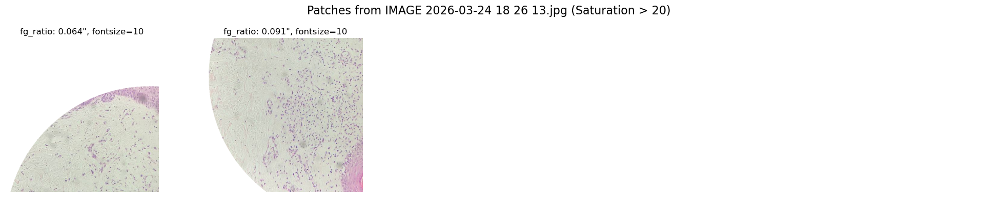


Processing: IMG_3754 2.jpeg
Image Size: 2917x3373, Patch Size: 512, Stride: 512


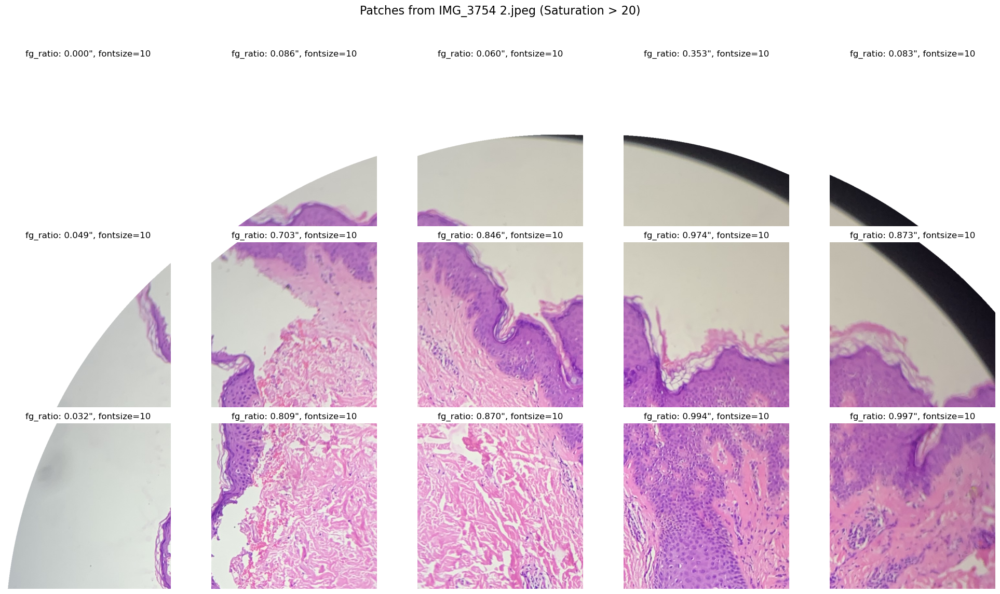


Processing: IMG_3757 2.jpeg
Image Size: 2899x3279, Patch Size: 512, Stride: 512


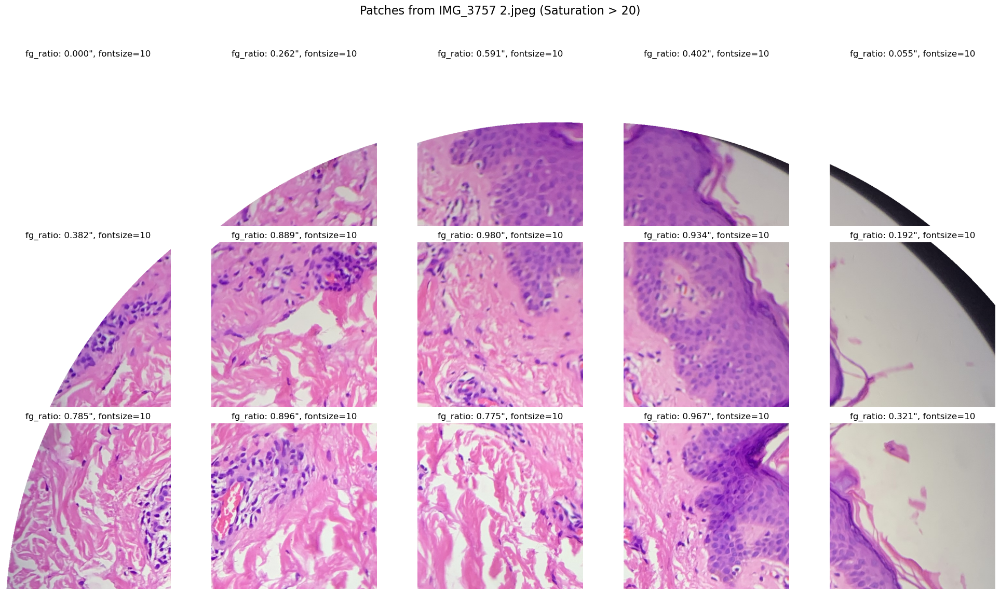


Processing: IMG_3977.jpeg
Image Size: 2825x3470, Patch Size: 512, Stride: 512


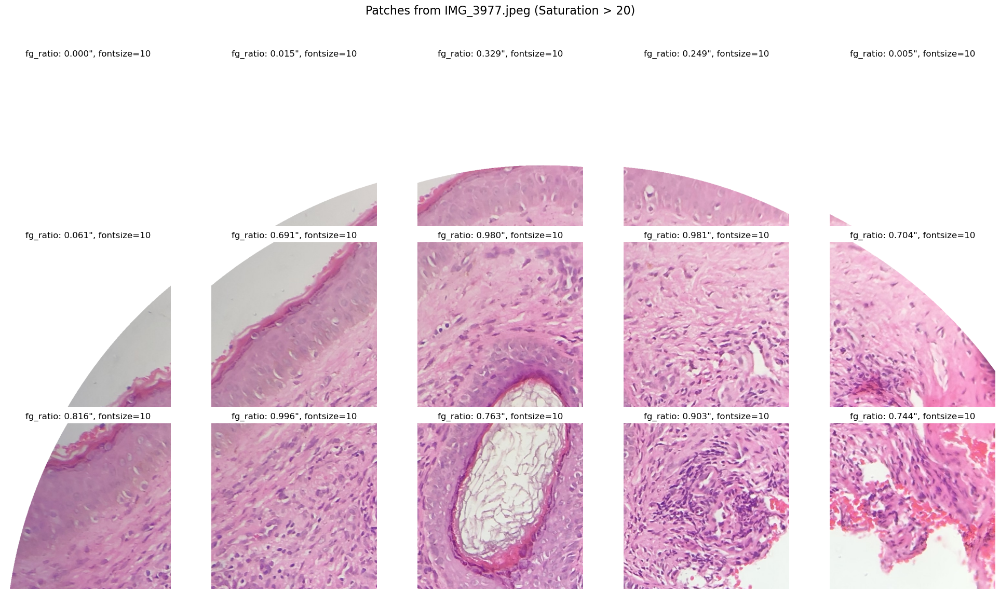


Processing: IMG_3975.jpeg
Image Size: 2828x3513, Patch Size: 512, Stride: 512


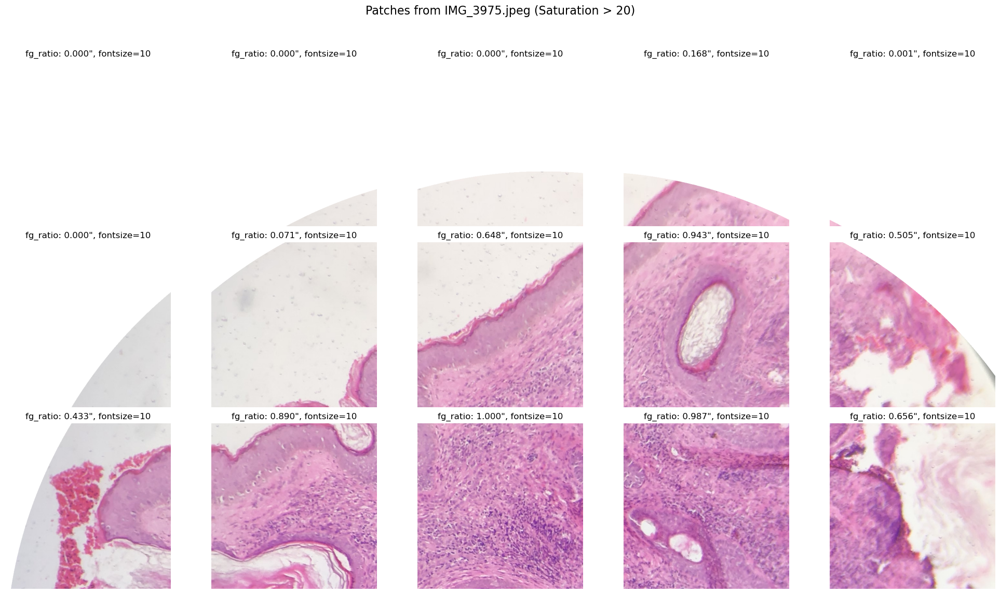


Processing: IMG_3905.jpeg
Image Size: 3024x3354, Patch Size: 512, Stride: 512


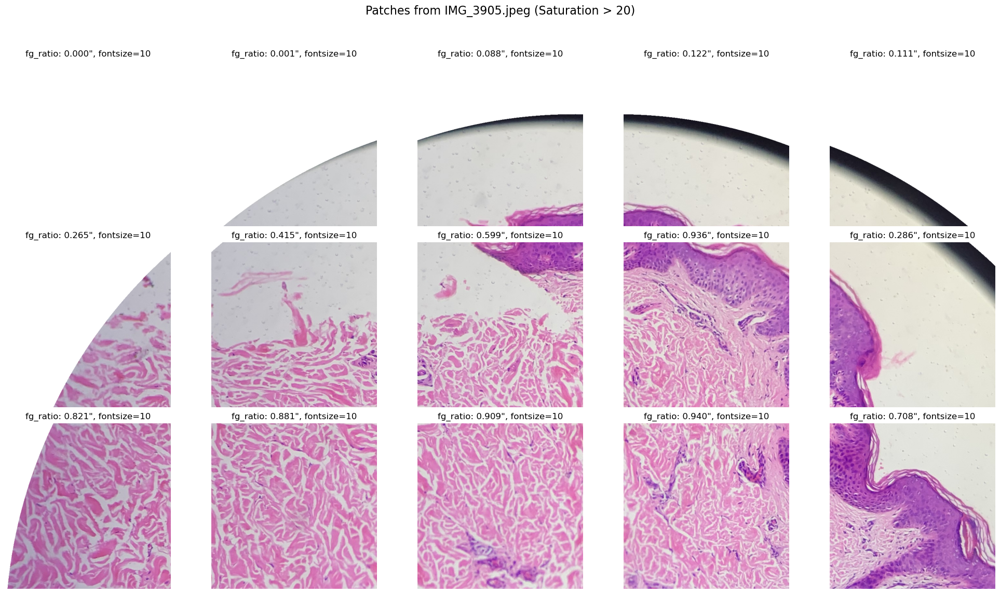

In [6]:
# Using HSV saturation for foreground ratio
def visualize_patches_with_fg_ratio(image_input, patch_size=512, stride=256, saturation_threshold=20, max_plots=20, image_name=None):
    """
    Extracts patches from an H&E image, calculates the foreground ratio based on
    color saturation, and plots them for visual inspection.
    
    Args:
        image_input: Either a file path (str) or a PIL Image object
        image_name: Optional name for display purposes
    """
    # Handle file paths, PIL Images, and numpy arrays
    if isinstance(image_input, str):
        try:
            img = Image.open(image_input).convert("RGB")
            if image_name is None:
                image_name = Path(image_input).name
        except FileNotFoundError:
            print(f"Error: Image not found at {image_input}")
            return
    elif isinstance(image_input, np.ndarray):
        # Convert numpy array to PIL Image
        if image_input.dtype != np.uint8:
            image_input = (image_input * 255).astype(np.uint8)
        img = Image.fromarray(image_input).convert("RGB")
        if image_name is None:
            image_name = "Input Image"
    else:
        # Assume it's a PIL Image
        img = image_input if image_input.mode == "RGB" else image_input.convert("RGB")
        if image_name is None:
            image_name = "Input Image"

    W, H = img.size
    patches_data = []

    print(f"\nProcessing: {image_name}")
    print(f"Image Size: {W}x{H}, Patch Size: {patch_size}, Stride: {stride}")

    # Extract patches and calculate ratios
    for y in range(0, H - patch_size + 1, stride):
        for x in range(0, W - patch_size + 1, stride):
            crop = img.crop((x, y, x + patch_size, y + patch_size))
            arr = np.asarray(crop)
            
            # Convert to HSV color space
            hsv_img = cv2.cvtColor(arr, cv2.COLOR_RGB2HSV)
            # Get the saturation channel (index 1)
            saturation = hsv_img[:, :, 1]
            # Calculate foreground ratio based on saturation
            fg_ratio = (saturation > saturation_threshold).mean()
            
            patches_data.append({"patch": crop, "ratio": fg_ratio})

    # Plot the patches
    if not patches_data:
        print("No patches were extracted.")
        return
        
    # Limit plots to max_plots for readability
    num_plots = min(len(patches_data), max_plots)
    cols = 5
    rows = (num_plots + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    fig.suptitle(f"Patches from {image_name} (Saturation > {saturation_threshold})", fontsize=16)
    
    # Flatten axes array for easy iteration
    axes = axes.flatten()

    for i in range(num_plots):
        ax = axes[i]
        data = patches_data[i]
        ax.imshow(data["patch"])
        ax.set_title(f'fg_ratio: {data["ratio"]:.3f}", fontsize=10')
        ax.axis("off")

    # Hide unused subplots
    for i in range(num_plots, len(axes)):
        axes[i].axis("off")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


# Iterate over your sample images and visualize the patches using cropped images
for img_p in imgs_path:
    if img_p in cropped_images:
        visualize_patches_with_fg_ratio(cropped_images[img_p], patch_size=512, stride=512, saturation_threshold=20, max_plots=15, image_name=Path(img_p).name)
